# 1. Mengimpor Library

Pada tahap ini, kita mengimpor seluruh library yang diperlukan, seperti numpy, pandas, seaborn, matplotlib, dan sklearn.

In [49]:
import textwrap
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# 2. Data Loading

Selanjutnya, kita melihat 10 baris pertama dari data dengan `.head()` dan ukuran dari data dengan `.shape`.

In [2]:
data = pd.read_csv("/content/music_dataset.csv", index_col = 0)

# Menampilkan sepuluh baris pertama pada data
data.head(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [3]:
# Menampilkan jumlah baris dan kolom pada data
total_row, total_column = data.shape
print(f"Total of rows: {total_row}")
print(f"Total of column: {total_column}")

Total of rows: 114000
Total of column: 20


Dari hasil di atas, diperoleh data ini memiliki 20 kolom dan 114000 baris.

# 3. Deskripsi Variabel

## Arti Variabel

Berikut adalah arti dari variabel-variabel pada data tersebut.

Variabel | Keterangan
----------|----------
track_id | ID lagu pada Spotify
artists | Penyanyi/artis pada lagu tersebut, dipisahkan dengan `;` jika terdapat lebih dari 1 artis
album_name | Judul album yang dirilis
track_name | Judul lagu yang dirilis
popularity | Popularitas lagu dari skala 0-100 berdasarkan total lagu diputar
duration_ms | Durasi lagu dalam satuan milidetik
explicit | Indikasi lagu memiliki lirik yang eksplisit (true = iya, false = tidak)
danceability | Kecocokan lagu untuk menari dari skala 0-1, dengan 0 tidak cocok dan 1 sangat cocok
energy | Intensitas dan aktivitas pada lagu dari skala 0-1, dengan 0 sangat rendah dan 1 sangat tinggi
key | Kunci nada dalam lagu menggunakan notasi standar Pitch Class. Contohnya 0 = C, 1 = C#, 2 = D
loudness | Kekerasan suara pada lagu dalam satuan desibel (dB)
mode | Jenis skala konten melodi berasal, dengan 0 = minor dan 1 = major
speechiness	| Penggunaan kata yang sering diucapkan dari skala 0-1, dengan 0 jarang dan 1 sering
acousticness | Tingkat kepercayaan apakah lagu tersebut akustik atau tidak dari skala 0-1, dengan 0 tidak dan 1 iya
instrumentalness | Tingkat instrumental pada lagu dari skala 0-1, dengan 0 bukan dan 1 iya
liveness | Mendeteksi keberadaan penonton dalam lagu dari skala 0-1, dengan 0 tidak ada dan 1 ada
valence | Tingkat perasaan dalam lagu dari skala 0-1, dengan 0 negatif (sedih, marah) dan 1 positif (senang, euforia)
tempo | Tempo lagu dalam satuan beat per menit
time_signature | Jumlah beat per bagian. Contohnya jika 4, maka lagu tersebut menggunakan birama 4/4
track_genre | Genre dari lagu tersebut

## Memeriksa Tipe Variabel Beserta Jumlah

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           114000 

Dari hasil di atas, terdapat
* 9 kolom bertipe float
* 5 kolom bertipe integer
* 5 kolom bertipe object
* 1 kolom bertipe boolean

Selain itu, pada kolom artists, album_name, dan track_name terdapat 1 baris dengan nilai null. Hal ini akan diperiksa nanti pada bagian data cleaning.

## Menampilkan Deskripsi Statistik dari Data

In [5]:
data.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


Dari hasil di atas, disimpulkan
* Terdapat lagu berdurasi 0 milidetik. Hal ini tidak mungkin, sehingga akan diperiksa pada data cleaning.
* Pada `key`, tidak ada yang bernilai -1 sehingga seluruh kunci lagu terdefinisi.
* Selain dua hal di atas, seluruh data lainnya terlihat normal.

# 4. Data Cleaning

## Memeriksa Nilai yang Kosong pada Data

In [6]:
# Menjumlahkan nilai null yang ada pada data
pd.DataFrame({'Nilai yang Kosong':data.isnull().sum()})

,Nilai yang Kosong
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0
key,0


Terlihat bahwa terdapat 3 kolom yang memiliki 1 baris dengan nilai kosong. Akan diperiksa apakah nilai null ini pada baris yang sama atau berbeda.

In [7]:
# Menghitung nilai null pada masing-masing baris
nilai_null_per_baris = data.isnull().sum(axis = 1)
total_nilai_null = nilai_null_per_baris.value_counts().sort_index()

# Menampilkan baris yang memiliki nilai null beserta jumlahnya
for missing, row in total_nilai_null.items():
    print(f'{row} baris memiliki nilai null sebanyak {missing}')

# Menampilkan jumlah baris yang memiliki nilai null
total_baris_dengan_nilai_null = (data.isnull().any(axis = 1)).sum()
print(f'Total baris yang memiliki nilai null: {total_baris_dengan_nilai_null}')

113999 baris memiliki nilai null sebanyak 0
1 baris memiliki nilai null sebanyak 3
Total baris yang memiliki nilai null: 1


Dari hasil di atas, nilai null terdapat pada 1 baris yang sama.

In [8]:
# Menampilkan baris yang memiliki nilai null
data[data.isnull().any(axis = 1)]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,7,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


Terlihat bahwa baris ini memiliki nilai null pada kolom `artists`, `album_name`, dan `track_name`. Selain itu, baris ini juga memiliki durasi 0 milidetik yang tentu tidak mungkin. Maka baris ini akan dihapus.

In [9]:
# Menghapus baris yang memiliki nilai null pada data
data.drop(data[data.isnull().any(axis = 1)].index, inplace = True)

# Menampilkan jumlah baris dan kolom pada data setelah menghapus baris dengan nilai null
total_row, total_column = data.shape
print(f"Total of rows: {total_row}")
print(f"Total of column: {total_column}")

Total of rows: 113999
Total of column: 20


Selanjutnya, akan dilihat deskripsi statistik dari data setelah dihapus 1 baris.

In [10]:
data.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034
std,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


Berdasarkan hasil deskripsi statistik di atas, terlihat bahwa nilai-nilai di atas sudah sesuai dan mungkin terjadi, sehingga tidak akan diperiksa terkait outlier.

## Memeriksa Data Duplikat

In [11]:
# Menghitung jumlah data duplikat
data.duplicated().sum()

450

Dari hasil di atas, terdapat 450 data duplikat. Akan diperiksa terlebih dahulu apakah data duplikat ini pada seluruh kolom.

In [12]:
# Menampilkan data duplikat
data[data.duplicated]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
1925,0CDucx9lKxuCZplLXUz0iX,Buena Onda Reggae Club,Disco 2,Song for Rollins,16,219346,False,0.841,0.577,0,-7.544,1,0.0438,0.238000,0.860000,0.0571,0.843,90.522,4,afrobeat
2155,2aibwv5hGXSgw7Yru8IYTO,Red Hot Chili Peppers,Stadium Arcadium,Snow (Hey Oh),80,334666,False,0.427,0.900,11,-3.674,1,0.0499,0.116000,0.000017,0.1190,0.599,104.655,4,alt-rock
3738,7mULVp0DJrI2Nd6GesLvxn,Joy Division,Timeless Rock Hits,Love Will Tear Us Apart,0,204621,False,0.524,0.902,2,-8.662,1,0.0368,0.000989,0.695000,0.1370,0.907,146.833,4,alternative
4648,6d3RIvHfVkoOtW1WHXmbX3,Little Symphony,Serenity,Margot,27,45714,False,0.269,0.142,0,-23.695,1,0.0509,0.866000,0.904000,0.1140,0.321,67.872,3,ambient
5769,481beimUiUnMUzSbOAFcUT,SUPER BEAVER,突破口 / 自慢になりたい,突破口,54,255080,False,0.472,0.994,8,-1.786,1,0.1140,0.025900,0.000000,0.0535,0.262,103.512,4,anime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111246,0sSjIvTvd6fUSZZ5rnTPDW,Everything But The Girl,Eden (Deluxe Edition),Another Bridge - 2012 Remaster,26,132826,False,0.480,0.853,0,-6.276,1,0.0734,0.030600,0.000001,0.3200,0.775,85.181,4,trip-hop
111362,2zg3iJW4fK7KZgHOvJU67z,Faithless,Faithless 2.0,Tarantula,21,398152,False,0.622,0.816,6,-11.095,0,0.0483,0.009590,0.578000,0.0991,0.427,136.007,4,trip-hop
111980,46FPub2Fewe7XrgM0smTYI,Morcheeba,Parts of the Process,Undress Me Now,17,203773,False,0.576,0.352,7,-10.773,0,0.0268,0.700000,0.270000,0.1600,0.360,95.484,4,trip-hop
112968,6qVA1MqDrDKfk9144bhoKp,Acil Servis,Küçük Adam,Bebek,38,319933,False,0.486,0.485,5,-12.391,0,0.0331,0.004460,0.000017,0.3690,0.353,120.095,4,turkish


Dari hasil di atas, terlihat bahwa tidak ada baris yang duplikat satu sama lain. Kemungkinan data dianggap duplikat karena terdapat beberapa kolom yang bernilai sama. Oleh karena itu, 450 data yang dianggap duplikat tidak akan dihapus. Data sudah siap untuk diproses dan dianalisis.

# 5. Exploratory Data Analysis (EDA)

Pertama, kita akan membagi variabel-variabel yang ada menjadi 2 kategori, yaitu kategori kategorical dan kategori numerikal.

In [13]:
# Membentuk data berisi kolom-kolom kategorikal (data yang bertipe object dan bool)
kolom_kategorikal = data[data.columns[(data.dtypes == "object") | (data.dtypes == "bool")]]

# Menampilkan data kolom kategorikal
kolom_kategorikal.head(10)

,track_id,artists,album_name,track_name,explicit,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,False,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,False,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,False,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,False,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,False,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,False,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,False,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,False,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,False,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,False,acoustic


In [14]:
# Membentuk data berisi kolom-kolom numerikal (data yang bertipe float64 dan int64)
kolom_numerikal = data[data.columns[(data.dtypes == "float64") | (data.dtypes == "int64")]]

# Menampilkan data kolom numerikal
kolom_numerikal.head(10)

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4
1,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4
2,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4
3,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3
4,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4
5,58,214240,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4
6,74,229400,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3
7,80,242946,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4
8,74,189613,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4
9,56,205594,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4


## A. Analisis Kolom `explicit`

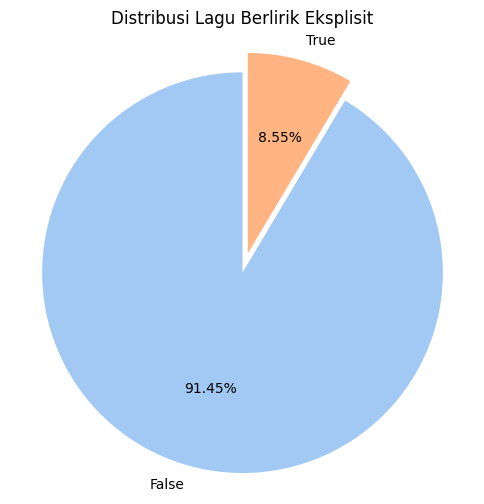

In [15]:
# Membentuk DataFrame pada kolom explicit
explicit = pd.DataFrame(data["explicit"])

# Mendapatkan nilai-nilai yang berbeda pada kolom explicit beserta jumlahnya
nilai_unik, jumlah_nilai = np.unique(explicit, return_counts = True)

# Membentuk plot
fig, ax = plt.subplots(figsize = (6, 6))

# Memisahkan salah satu bagian pada pie plot
true_part = [0, 0.1]
colors = sns.color_palette("pastel")

# Membentuk pie plot
ax.pie(jumlah_nilai, labels = nilai_unik, autopct = "%1.2f%%",
       startangle = 90, colors = colors, explode = true_part)
ax.axis("equal")

# Memberikan judul pada plot
ax.set_title("Distribusi Lagu Berlirik Eksplisit")

# Menampilkan plot
plt.show()

Dari gambar di atas, hanya 8.55% dari seluruh lagu memiliki lirik yang bersifat explisit.

## B. Analisis Distribusi Kolom Numerikal dengan Histogram

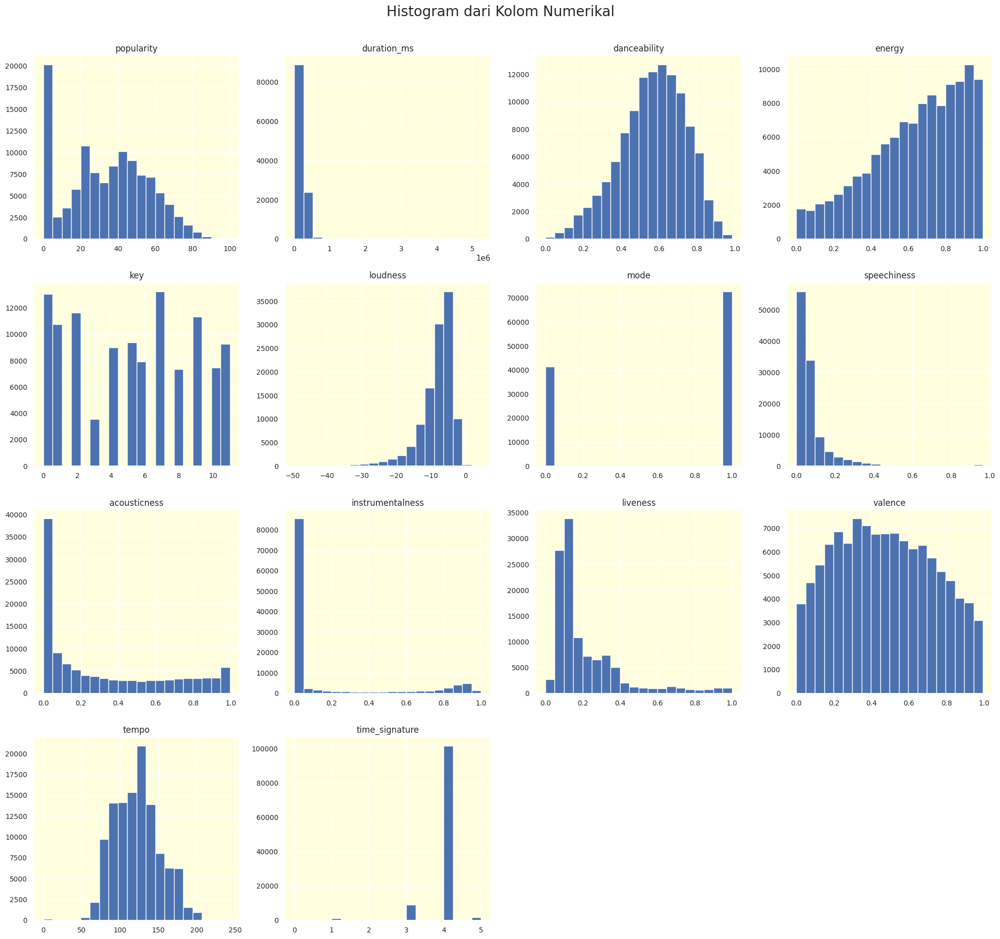

In [16]:
sns.set_style("darkgrid")
sns.set(rc = {"axes.facecolor" : "lightyellow", "figure.facecolor" : "white"})
kolom_numerikal.hist(figsize = (20, 20), bins = 20, xlabelsize = 10, ylabelsize = 10)
plt.tight_layout(rect = [0, 0.05, 1, 0.95])
plt.suptitle("Histogram dari Kolom Numerikal", fontsize = 20)
plt.ylabel("Jumlah")
plt.show()

Gambar di atas dapat diinterpretasikan sebagai berikut.
* Kolom `danceability`, `valence`, dan `tempo` mendekati distribusi normal. Kolom `popularity` juga mendekati distribusi normal, namun mayoritas data bernilai 0.
* Kolom `loudness` memiliki histogram yang bersifat left-skewed. Artinya mayoritas data bernilai tinggi, yang berarti banyak musik memiliki `loudness` sekitar -15 hingga 0 dB.
* Kolom `speechiness`, `acousticness`, dan `liveness` memiliki histogram yang bersifat right-skewed. Artinya mayoritas data pada kolom-kolom tersebut bernilai rendah.
* Kolom `energy` memiliki distribusi yang semakin tinggi untuk tingkat energi yang semakin tinggi.
* Kolom `duration_ms` menunjukkan mayoritas lagu memiliki durasi dibawah 1000000 milidetik.
* Kolom `mode` hanya memiliki 2 nilai data, yaitu 0 dan 1, sesuai dengan arti dari `mode`. Nilai 1 lebih banyak dari 0 yang menunjukkan mayoritas lagu menggunakan skala mayor.
* Kolom `instrumentalness` memiliki nilai mayoritas mendekati yang berarti mayoritas lagu bukan merupakan instrumental (hanya berisi iringan musik tanpa lirik).

## C. Korelasi Seluruh Variabel Numerik dengan Heatmap

Sebelum melihat korelasi dari seluruh variabel numerik, akan ditetapkan batasan nilai korelasi beserta artinya. Misalkan $x$ merupakan nilai korelasi suatu variabel
* Korelasi bernilai $0.00 \leq x \leq 0.30$ dan $-0.30 \leq x \leq 0.00$ merupakan korelasi yang bersifat sangat lemah. Artinya, variabel-variabel tersebut memiliki keterkaitan yang kecil atau bahkan tidak ada kaitan.
* Korelasi bernilai $0.31 \leq x \leq 0.60$ dan $-0.60 \leq x \leq -0.31$ merupakan korelasi yang bersifat cukup kuat. Artinya, variabel-variabel tersebut memiliki keterkaitan yang cukup kuat satu sama lain.
* Korelasi bernilai $0.61 \leq x \leq 1.00$ dan $-1.00 \leq x \leq -0.61$ merupakan korelasi yang bersifat sangat kuat. Artinya, variabel-variabel tersebut memiliki keterkaitan yang kuat atau bahkan sangat kuat.

Berdasarkan 3 tingkatan tersebut, korelasi dibagi menjadi 2, yaitu korelasi positif dan korelasi negatif.
* Korelasi positif merupakan korelasi yang bernilai $0.00 <x \leq 1.00$. Artinya, semakin tinggi nilai salah satu variabel, maka nilai variabel lainnya juga akan semakin tinggi. Hal ini berlaku sebaliknya.
* Korelasi positif merupakan korelasi yang bernilai $-1.00 <x \leq 0.00$. Artinya, semakin tinggi nilai salah satu variabel, maka nilai variabel lainnya justru akan semakin rendah. Hal ini berlaku sebaliknya.

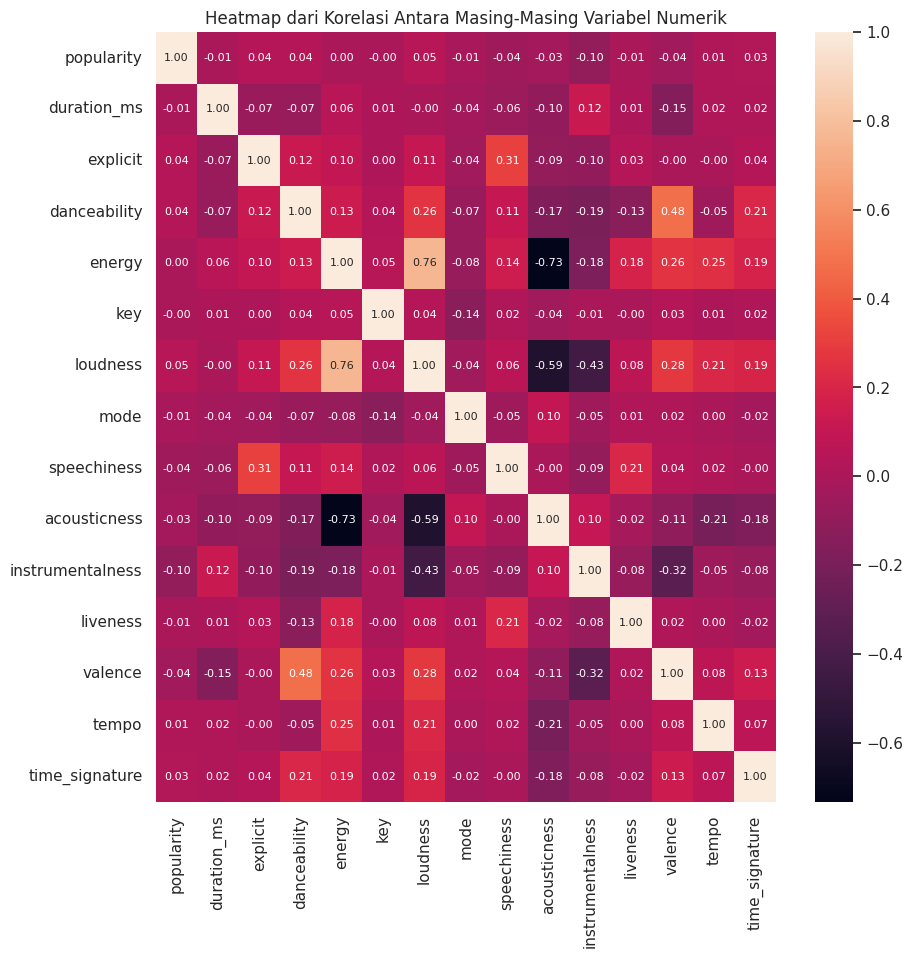

In [17]:
# Mencari korelasi antara masing-masing variabel numerik dengan korelasi pearson
corr = data.corr(method = "pearson", numeric_only = True)

# Membentuk heatmap antara masing-masing variabel numerik dan ditampilkan dalam bentuk desimal 2 angka di belakang koma
plt.figure(figsize = (10, 10))
sns.heatmap(corr, annot = True, fmt = ".2f", annot_kws = {"size": 8})

# Menambahkan judul pada plot
plt.title("Heatmap dari Korelasi Antara Masing-Masing Variabel Numerik")

# Menampilkan plot
plt.show()

Heatmap di atas dapat diinterpretasikan sebagai berikut.
* Variabel `danceability` berkorelasi positif yang cukup kuat terhadap variabel `valence`
* Variabel `energy` berkorelasi positif yang kuat terhadap variabel `loudness`, namun berkorelasi negatif yang kuat terhadap variabel `acousticness`
* Variabel `loudness` berkorelasi negatif yang cukup kuat terhadap variabel `acousticness` dan variabel `instrumentalness`
* Variabel `instrumentalness` berkorelasi negatif yang cukup kuat terhadap variabel `valence`

Selain yang disebutkan di atas, seluruh variabel memiliki korelasi yang lemah antara satu dengan yang lain.

## D. Scatter Plot Antara Variabel `danceability` dengan `valence`

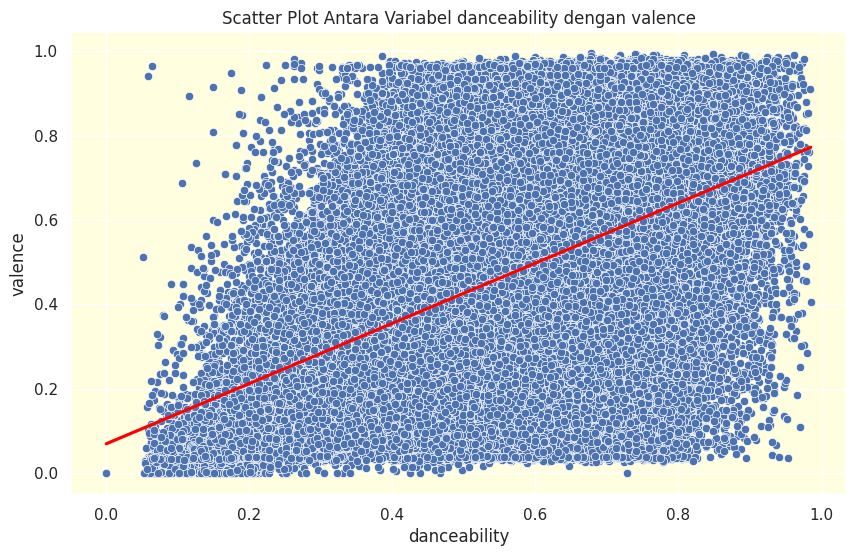

In [18]:
# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk scatter plot dengan garis trendline
sns.scatterplot(data = kolom_numerikal, x = "danceability", y = "valence")
sns.regplot(data = kolom_numerikal, x = "danceability",
            y = "valence", scatter = False, color = "red")

# Menambahkan judul pada plot
plt.title("Scatter Plot Antara Variabel danceability dengan valence")

# Menampilkan plot
plt.show()

* Terlihat bahwa variabel `danceability` berkorelasi positif yang cukup kuat terhadap variabel `valence`, terlihat dari garis yang mengarah ke atas kanan.
* Kedua variabel ini berkorelasi positif cukup kuat karena lagu yang memiliki perasaan positif seperti senang tentu juga cocok untuk menari.
* Akan aneh apabila lagu sedih bisa digunakan untuk menari, sehingga dapat dilihat bahwa lagu yang yang memang memiliki perasaan negatif seperti sedih dan marah tidak cocok untuk menari.

## E. Scatter Plot Antara Variabel `energy` dengan `loudness` dan `acousticness`

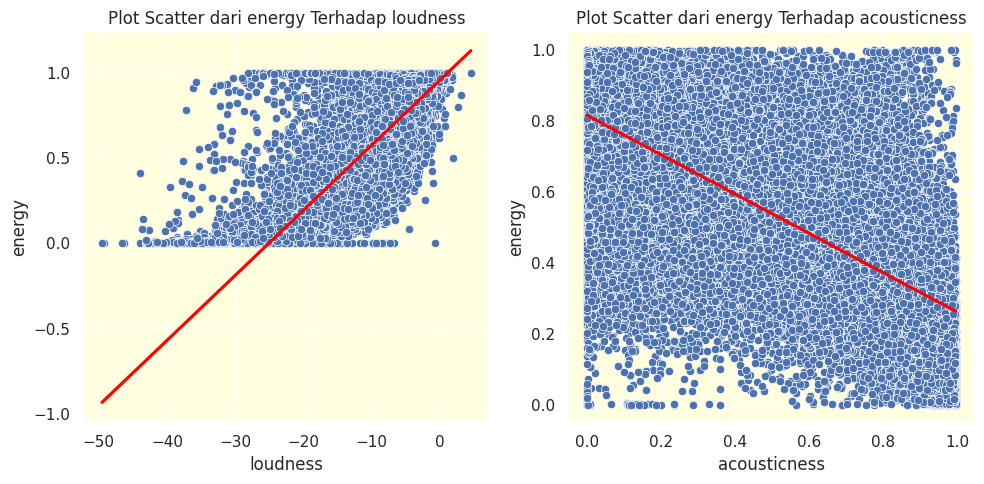

In [19]:
# Membentuk plot dengan subplot sejumlah 4 berukuran 2 x 2
fig, axes = plt.subplots(1, 2, figsize = (10, 5))

# Mengubah array multi dimensi menjadi array 1 dimensi
axes = axes.flatten()

# Membentuk dictionary dari variabel yang memiliki nilai korelasi lebih dari / sama dengan 0.2
data_x = {0: "loudness", 1: "acousticness"}

# Mendeskripsikan kolom-kolom numerikal yang akan digunakan berdasarkan dictionary di atas
deskripsi_kolom = ["loudness", "acousticness"]

# Membentuk plot scatter untuk masing-masing kolom beserta garis trend
for keys, values in data_x.items():
    sns.scatterplot(data = data, x = values, y = "energy", ax = axes[keys])
    sns.regplot(data = data, x = values, y = "energy",
                scatter = False, ax = axes[keys], color = "red")

    # Menambahkan judul untuk masing-masing plot
    judul = "\n".join(textwrap.wrap(f"Plot Scatter dari energy Terhadap {deskripsi_kolom[keys]}", width = 50))
    axes[keys].set_title(judul)
    axes[keys].title.set_size(12)

# Mengatur susunan agar tidak berhimpitan
plt.tight_layout()

# Menampilkan plot
plt.show()

* Terlihat bahwa variabel `energy` berkorelasi positif yang kuat terhadap variabel `loudness`, terlihat dari garis yang mengarah ke atas kanan, tetapi berkorelasi negatif yang cukup kuat terhadap variabel `acousticness`, terlihat dari garis yang mengarah ke bawah kanan.
* Secara umum, semakin keras suara lagu tersebut, semakin berenergi lagu tersebut, terutama pada genre seperti metal music. Oleh karena itu, variabel `energy` dan `loudness` berkorelasi positif yang kuat.
* Sementara itu, lagu akustik biasanya menggunakan alat musik akustik yang tentu suaranya lebih pelan dibanding alat musik elektrik, serta lagu akustik biasa dinyanyikan dengan suara yang pelan, indah, dan tanpa batuan mikrofon. Akibatnya, jika lagu tersebut merupakan akustik, tentu energinya lebih rendah dibanding lagu non akustik. Oleh karena itu, variabel `energy` dan `acousticness` berkorelasi negatif yang cukup kuat.

## F. Scatter Plot antara Variabel `loudness` dengan `acousticness` dan `instrumentalness`

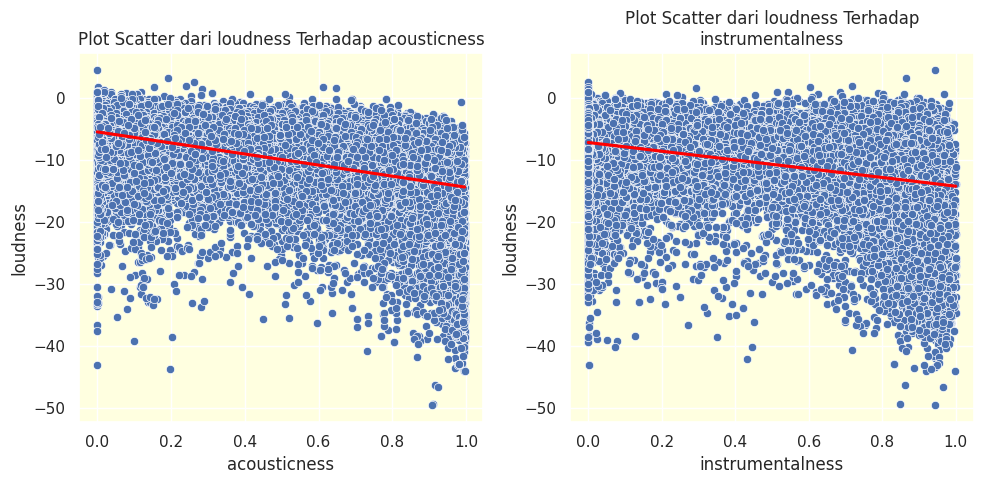

In [20]:
# Membentuk plot dengan subplot sejumlah 4 berukuran 2 x 2
fig, axes = plt.subplots(1, 2, figsize = (10, 5))

# Mengubah array multi dimensi menjadi array 1 dimensi
axes = axes.flatten()

# Membentuk dictionary dari variabel yang memiliki nilai korelasi lebih dari / sama dengan 0.2
data_x = {0: "acousticness", 1: "instrumentalness"}

# Mendeskripsikan kolom-kolom numerikal yang akan digunakan berdasarkan dictionary di atas
deskripsi_kolom = ["acousticness", "instrumentalness"]

# Membentuk plot scatter untuk masing-masing kolom beserta garis trend
for keys, values in data_x.items():
    sns.scatterplot(data = data, x = values, y = "loudness", ax = axes[keys])
    sns.regplot(data = data, x = values, y = "loudness",
                scatter = False, ax = axes[keys], color = "red")

    # Menambahkan judul untuk masing-masing plot
    judul = "\n".join(textwrap.wrap(f"Plot Scatter dari loudness Terhadap {deskripsi_kolom[keys]}", width = 50))
    axes[keys].set_title(judul)
    axes[keys].title.set_size(12)

# Mengatur susunan agar tidak berhimpitan
plt.tight_layout()

# Menampilkan plot
plt.show()

* Terlihat bahwa variabel `loudness` berkorelasi negatif yang cukup kuat terhadap variabel `acousticness` dan `instrumentalness`, terlihat dari garis yang mengarah ke bawah kanan.
* Seperti pada pembahasan sebelumnya, lagu akustik cenderung memiliki suara yang pelan dan indah sehingga suaranya tidak kencang.
* Selain itu, musik yang hanya instrumental (hanya iringan alat musik tanpa lirik) cenderung memiliki suara konstan yang cukup kencang dibandingkan dengan musik non instrumental yang iringan musiknya akan sedikit pelan ketika lirik lagu dinyanyikan.

## G. Scatter Plot antara Variabel `instrumentalness` dengan `valence`

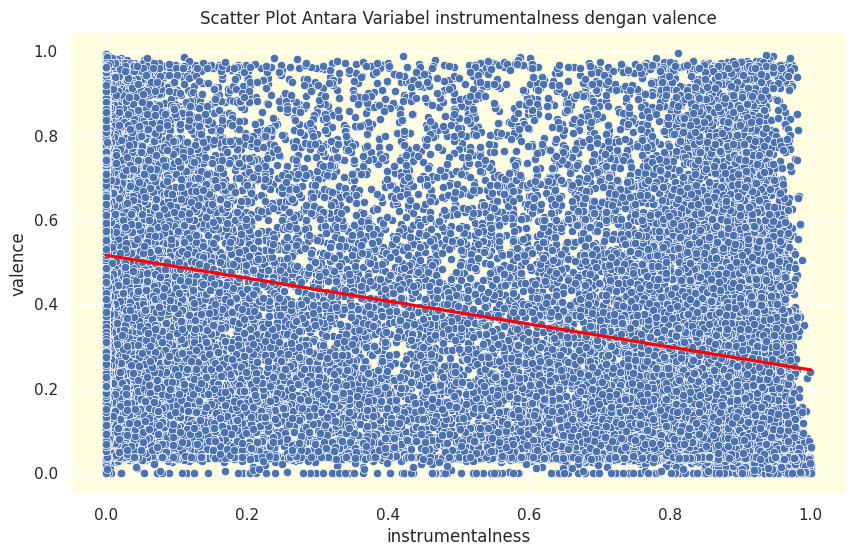

In [21]:
# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk scatter plot antara kolom instrumentalness dengan valence
sns.scatterplot(data = kolom_numerikal, x = "instrumentalness", y = "valence")

# Membentuk garis trend untuk melihat korelasi
sns.regplot(data = kolom_numerikal, x = "instrumentalness",
            y = "valence", scatter = False, color = "red")

# Memberikan judul pada plot
plt.title("Scatter Plot Antara Variabel instrumentalness dengan valence")

# Menampilkan plot
plt.show()

* Terlihat bahwa variabel `instrumentalness` berkorelasi negatif yang cukup kuat terhadap variabel `valence`, terlihat dari garis yang mengarah ke bawah kanan.
* Biasanya, suasana ceria dalam lagu dibawakan bersamaan dengan nyanyian lirik lagu. Sementara suasana negatif, terutama sedih, dibawakan hanya dalam bentuk instrumental (contohnya dengan violin saja)

## H. Top 10 Album dengan Jumlah Musik Terbanyak

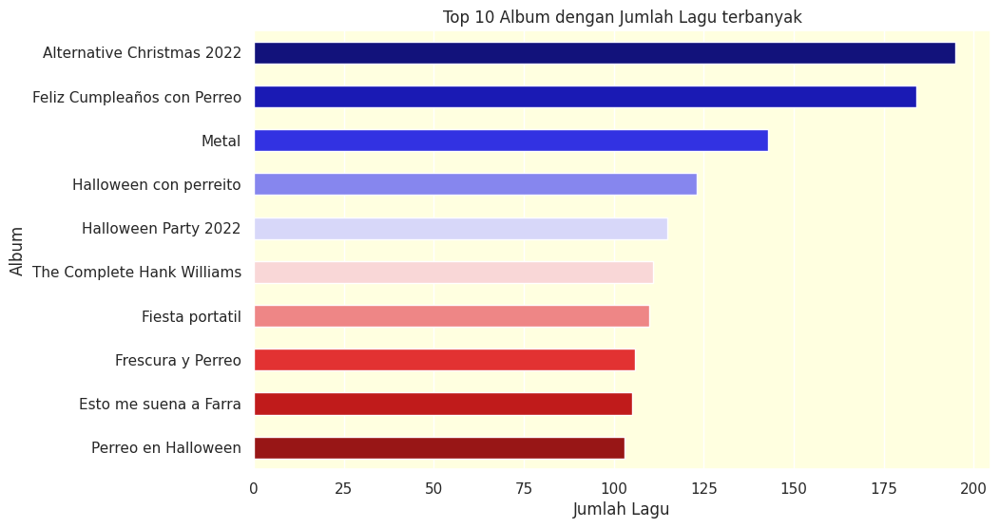

In [22]:
# Mengatur style warna pada seaborn
sns.set_style("darkgrid")
sns.set(rc = {"axes.facecolor" : "lightyellow", "figure.facecolor" : "white"})

# Mencari top 10 album yang memiliki jumlah lagu terbanyak
top_albums = data["album_name"].value_counts().head(10).reset_index()
top_albums.columns = ["album_name", "frequency"]

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom album_name dengan frequency
sns.barplot(x = "frequency", y = "album_name", data = top_albums,
            palette = "seismic", zorder = 3, width = 0.5, hue = "album_name")

# Memberi judul dan label pada plot
plt.title(f"Top 10 Album dengan Jumlah Lagu terbanyak")
plt.xlabel("Jumlah Lagu")
plt.ylabel("Album")

# Menampilkan plot
plt.show()

Dari gambar di atas, album `Alternative Christmas 2022` merupakan album yang memiliki jumlah lagu terbanyak, hingga mendekati 200 lagu.

## I. Analisis Genre Musik

Sebelumnya, akan dicari jumlah genre yang terdapat dalam data ini.

In [23]:
# Menghitung jumlah genres yang ada
unique_genres = data["track_genre"].unique()
print(len(unique_genres))

114


Hasilnya, terdapat 114 genre musik yang terdapat di data.

### 1. Top 10 Genre Musik Berdasarkan Rata-Rata Popularitas Tertinggi

Selanjutnya, akan dicari 10 genre dengan rata-rata popularitas tertinggi.

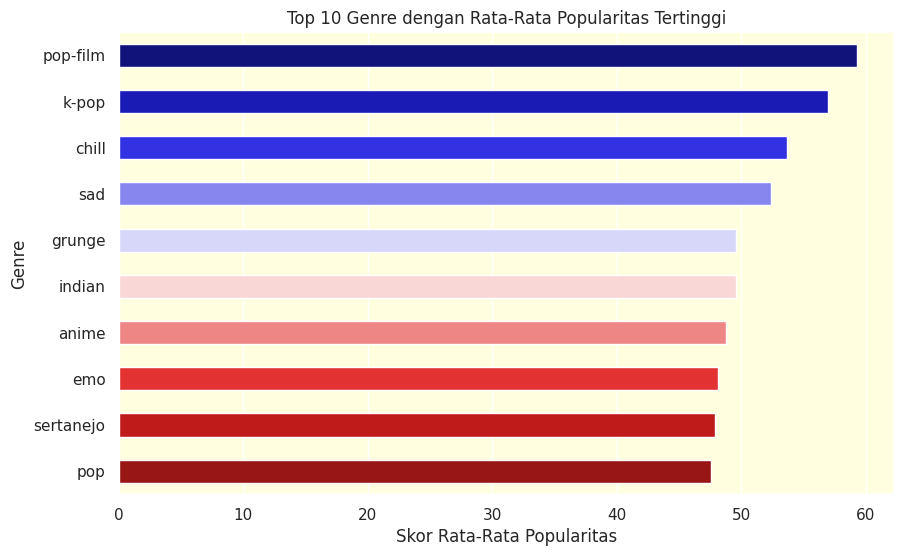

In [24]:
# Mencari rata-rata nilai popularitas dari setiap genre
average_popularity_by_genre = data.groupby("track_genre")["popularity"].mean().reset_index()

# Mengambil 10 genre dengan nilai rata-rata popularitas tertinggi
top10_popular_genre = average_popularity_by_genre.nlargest(10, "popularity")

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom popularity dengan track_genre
sns.barplot(x = "popularity", y = "track_genre", data = top10_popular_genre,
            palette = "seismic", zorder = 3, width = 0.5, hue = "track_genre")

# Memberi judul dan label pada plot
plt.title("Top 10 Genre dengan Rata-Rata Popularitas Tertinggi")
plt.xlabel("Skor Rata-Rata Popularitas")
plt.ylabel("Genre")

# Menampilkan plot
plt.show()

Dari gambar di atas, genre pop-film merupakan genre yang memiliki popularitas tertinggi secara rata-rata dibandingkan dengan genre lainnya, mendekati skor 60.

### 2. Top 10 Genre Musik yang Memiliki Lirik Eksplisit

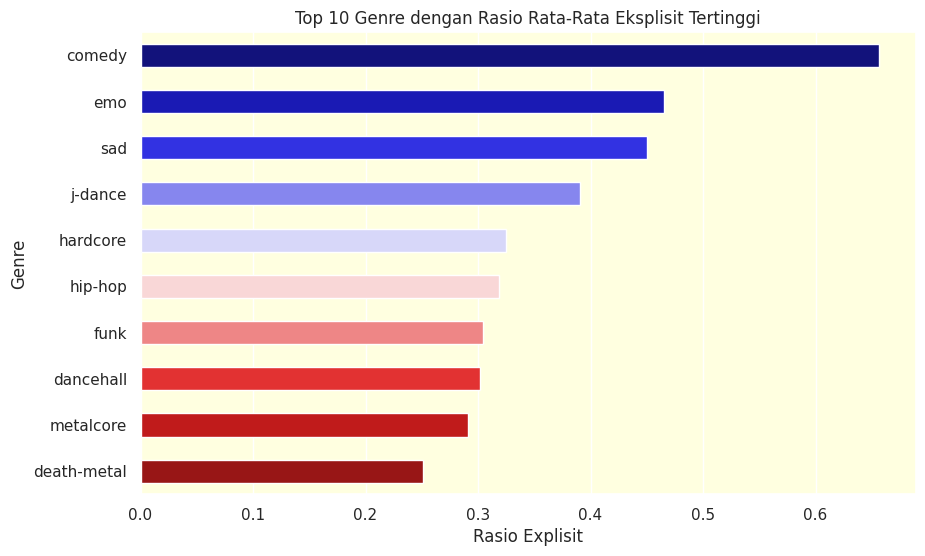

In [25]:
# Mencari rata-rata tingkat eksplisitas lirik dari setiap genre
explicit_ratio_by_genre = data.groupby("track_genre")["explicit"].mean().reset_index()

# Mengambil 10 genre dengan nilai rata-rata tingkat eksplisitas lirik tertinggi
top10_explicit_genres = explicit_ratio_by_genre.nlargest(10, "explicit")

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom popularity dengan track_genre
sns.barplot(x = "explicit", y = "track_genre", data = top10_explicit_genres,
            palette = "seismic", zorder = 3, width = 0.5, hue = "track_genre")

# Memberi judul dan label pada plot
plt.title("Top 10 Genre dengan Rasio Rata-Rata Eksplisit Tertinggi")
plt.xlabel("Rasio Explisit")
plt.ylabel("Genre")

# Menampilkan plot
plt.show()

Dari gambar di atas, genre komedi merupakan genre yang memiliki rasio lirik eksplisit tertinggi dibandingkan genre lainnya dengan rasio sekitar 0.65.

### 3. Genre yang memiliki Top 0.1% Jumlah Lagu Berdasarkan Popularitas

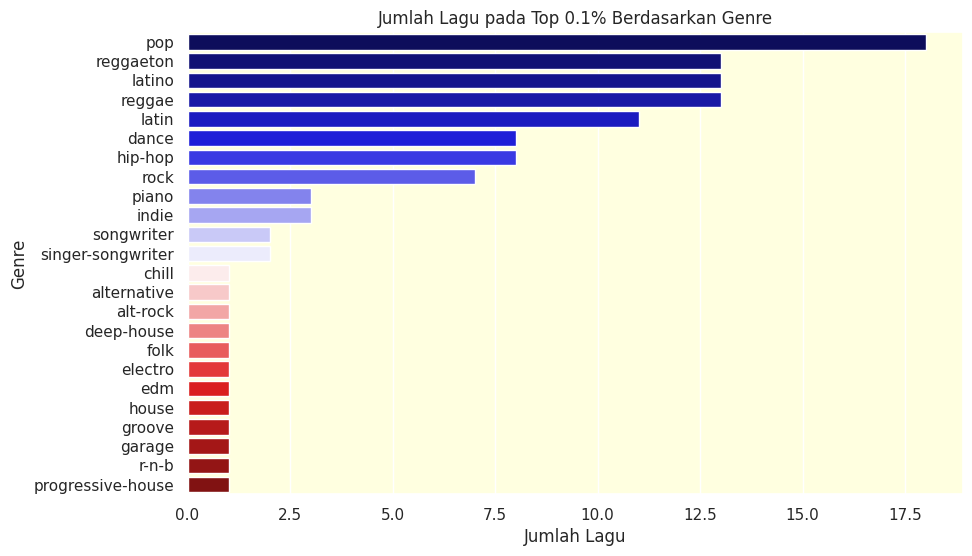

In [26]:
# Mengurutkan data berdasarkan nilai popularitas
data_sorted = data.sort_values(by = "popularity", ascending = False)

# Mengambil 0.1% data
top_01_percent = data_sorted.head(int(0.001 * len(data_sorted)))

# Menghitung jumlah lagu pada setiap genre dari 0.1% data
top_genres_count = top_01_percent.groupby("track_genre").size().reset_index(name = "count")

# Mengurutkan top_genres_count berdasar jumlah lagu pada setiap genre
top_genres_count = top_genres_count.sort_values(by = "count", ascending = False)

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom count dengan track_genre
sns.barplot(x = "count", y = "track_genre", hue = "track_genre",
            data = top_genres_count, palette = "seismic")

# Memberi judul dan label pada plot
plt.title("Jumlah Lagu pada Top 0.1% Berdasarkan Genre")
plt.xlabel("Jumlah Lagu")
plt.ylabel("Genre")

# Menampilkan plot
plt.show()

Dari gambar di atas, genre pop memiliki jumlah lagu terbanyak pada top 0.1% lagu dengan jumlah lebih dari 20.

### 4. Top 10 Genre dengan Jumlah Penyanyi Terbanyak

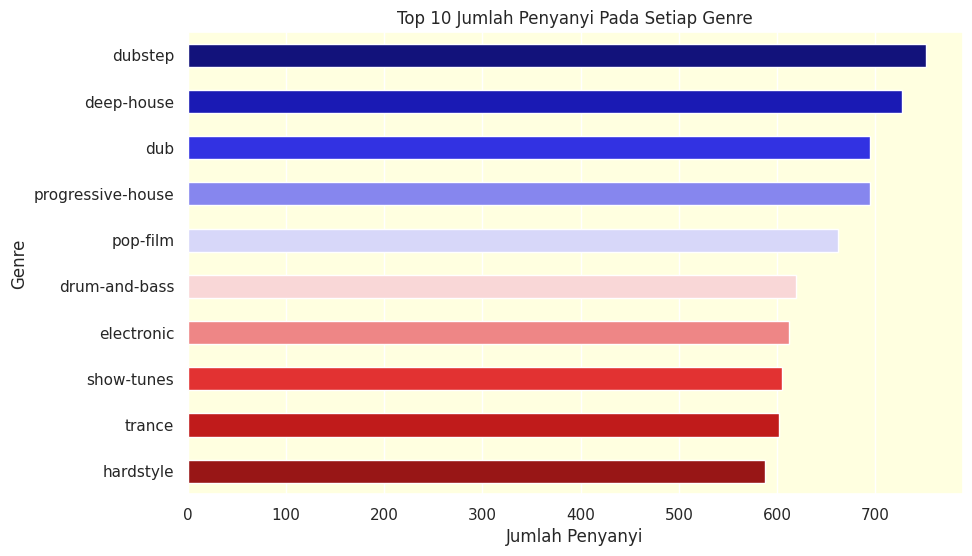

In [27]:
# Menghitung jumlah artis pada setiap genre
total_artist_by_genre = data.groupby("track_genre")["artists"].nunique().reset_index()

# Mengambil 10 genre dengan jumlah artis terbanyak
top10_artist_genres = total_artist_by_genre.nlargest(10, "artists")

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom artists dengan track_genre
sns.barplot(x = "artists", y = "track_genre", data = top10_artist_genres,
            zorder = 3, width = 0.5, hue = "track_genre", palette = "seismic")

# Memberi judul dan label pada plot
plt.title("Top 10 Jumlah Penyanyi Pada Setiap Genre")
plt.xlabel("Jumlah Penyanyi")
plt.ylabel("Genre")

# Menampilkan plot
plt.show()

Dari gambar di atas, genre dubstep merupakan genre yang memiliki artis terbanyak, berjumlah lebih dari 700.

## J. Analisis Penyanyi/Artis

Sebelumnya, akan dicari jumlah penyanyi yang terdapat dalam data ini.

In [28]:
# Menghitung jumlah penyanyi yang ada
unique_artist = data["artists"].unique()
print(len(unique_artist))

31437


Hasilnya, terdapat 31437 jumlah penyanyi yang terdapat di data.

### 1. Top 10 Penyanyi/Artis yang Memiliki Rata-Rata Popularitas Tertinggi

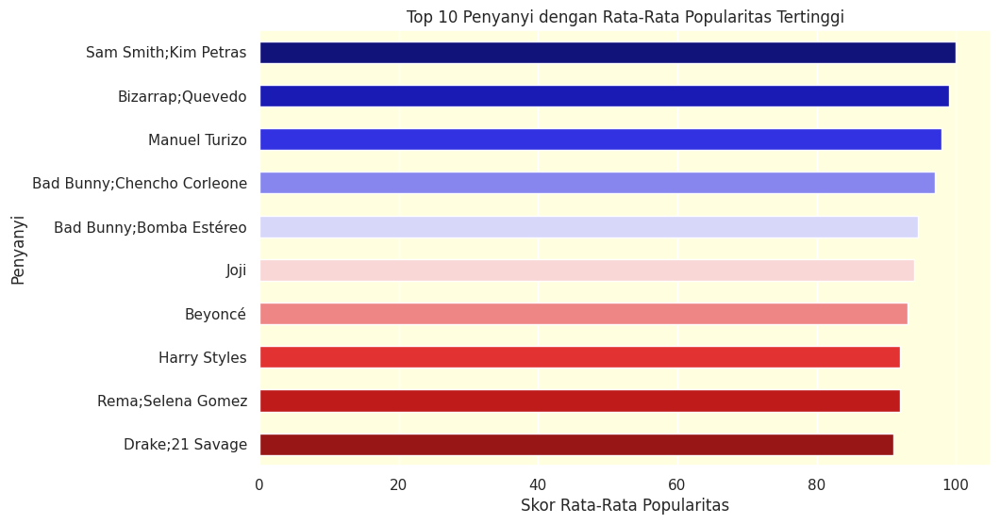

In [29]:
# Mencari rata-rata nilai popularitas dari setiap penyanyi
average_popularity_by_artist = data.groupby("artists")["popularity"].mean().reset_index()

# Mengambil 10 penyanyi dengan nilai rata-rata popularitas tertinggi
top10_popular_artists = average_popularity_by_artist.nlargest(10, "popularity")

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom popularity dengan artists
sns.barplot(x = "popularity", y = "artists", data = top10_popular_artists,
            palette = "seismic", zorder = 3, width = 0.5, hue = "artists")

# Memberi judul dan label pada plot
plt.title("Top 10 Penyanyi dengan Rata-Rata Popularitas Tertinggi")
plt.xlabel("Skor Rata-Rata Popularitas")
plt.ylabel("Penyanyi")

# Menampilkan plot
plt.show()

Dari gambar di atas, Sam Smith dan Kim Petras memiliki nilai popularitas tertinggi dibandingkan penyanyi lainnya.

### 2. Top 10 Penyanyi dengan Musik Terbanyak

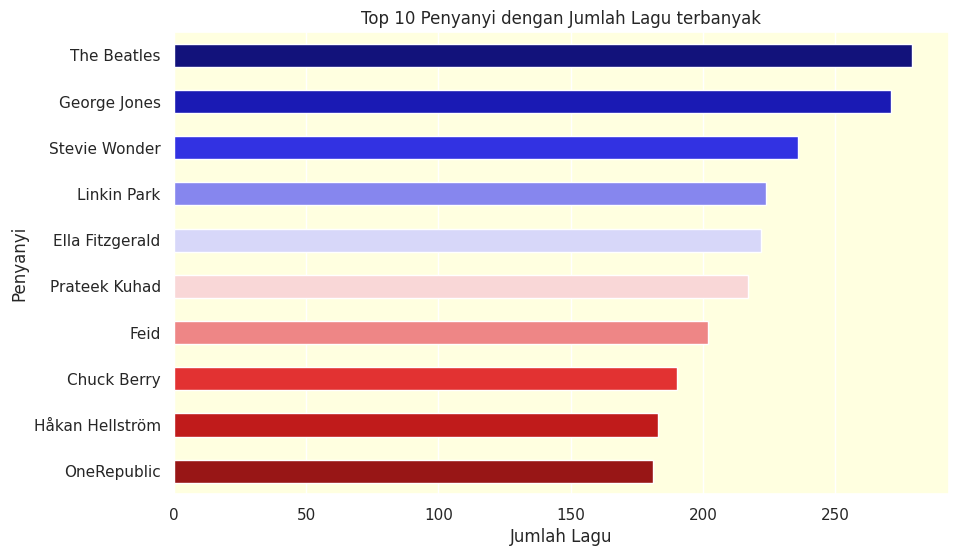

In [30]:
# Mencari 10 penyanyi dengan jumlah musik terbanyak
top_artists = data["artists"].value_counts().head(10).reset_index()
top_artists.columns = ["artist", "frequency"]

# Mengatur ukuran plot
plt.figure(figsize = (10, 6))

# Membentuk bar plot antara kolom frequency dengan artists
sns.barplot(x = "frequency", y = "artist", data = top_artists,
            palette = "seismic", zorder = 3, width = 0.5, hue = "artist")

# Memberi judul dan label pada plot
plt.title("Top 10 Penyanyi dengan Jumlah Lagu terbanyak")
plt.xlabel("Jumlah Lagu")
plt.ylabel("Penyanyi")

# Menampilkan plot
plt.show()

Dari gambar di atas, The Beatles telah membuat lagu terbanyak dibandingkan penyanyi lainnya, yaitu lebih dari 250.

# 6. Content-Based Filtering

## A. Data Preparation

Untuk content-based filtering, kita akan fokus pada judul lagu beserta genre dari lagu tersebut. Oleh karena itu, kita hanya akan mengambil 4 kolom dari data yang dimiliki.

In [31]:
# Mengonversi data series "track_id" menjadi dalam bentuk list
track_id = data["track_id"].tolist()

# Mengonversi data series "track_name" menjadi dalam bentuk list
track_name = data["track_name"].tolist()

# Mengonversi data series "album_name" menjadi dalam bentuk list
album_name = data["album_name"].tolist()

# Mengonversi data series "track_genre" menjadi dalam bentuk list
track_genre = data["track_genre"].tolist()

# Menampilkan banyak data dari masing-masing list
print(len(track_id))
print(len(track_name))
print(len(album_name))
print(len(track_genre))

113999
113999
113999
113999


Selanjutnya, kita akan membuat dictionary dari keempat kolom tersebut.

In [32]:
# Membuat dictionary untuk data ‘resto_id’, ‘resto_name’, dan ‘cuisine’
content_based_data = pd.DataFrame({
    "track_id": track_id,
    "track_name": track_name,
    "album_name": album_name,
    "track_genre": track_genre
})
content_based_data

,track_id,track_name,album_name,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Comedy,Comedy,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ghost - Acoustic,Ghost (Acoustic),acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,To Begin Again,To Begin Again,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Can't Help Falling In Love,Crazy Rich Asians (Original Motion Picture Sou...,acoustic
4,5vjLSffimiIP26QG5WcN2K,Hold On,Hold On,acoustic
...,...,...,...,...
113994,2C3TZjDRiAzdyViavDJ217,Sleep My Little Boy,#mindfulness - Soft Rain for Mindful Meditatio...,world-music
113995,1hIz5L4IB9hN3WRYPOCGPw,Water Into Light,#mindfulness - Soft Rain for Mindful Meditatio...,world-music
113996,6x8ZfSoqDjuNa5SVP5QjvX,Miss Perfumado,Best Of,world-music
113997,2e6sXL2bYv4bSz6VTdnfLs,Friends,Change Your World,world-music


Lalu kita akan menggunakan TF-IDF pada kolom track_genre.

In [33]:
# Inisialisasi TfidfVectorizer
tf = TfidfVectorizer()

# Melakukan perhitungan idf pada data track_genre
tf.fit(content_based_data["track_genre"])

# Mapping array dari fitur index integer ke fitur nama
tf.get_feature_names_out()

array(['acoustic', 'afrobeat', 'age', 'alt', 'alternative', 'ambient',
       'and', 'anime', 'bass', 'black', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago', 'children', 'chill',
       'classical', 'club', 'comedy', 'country', 'dance', 'dancehall',
       'death', 'deep', 'detroit', 'disco', 'disney', 'drum', 'dub',
       'dubstep', 'edm', 'electro', 'electronic', 'emo', 'film', 'folk',
       'forro', 'french', 'funk', 'garage', 'german', 'gospel', 'goth',
       'grindcore', 'groove', 'grunge', 'guitar', 'happy', 'hard',
       'hardcore', 'hardstyle', 'heavy', 'hip', 'honky', 'hop', 'house',
       'idm', 'idol', 'indian', 'indie', 'industrial', 'iranian', 'jazz',
       'kids', 'latin', 'latino', 'malay', 'mandopop', 'metal',
       'metalcore', 'minimal', 'mpb', 'music', 'new', 'opera', 'pagode',
       'party', 'piano', 'pop', 'power', 'progressive', 'psych', 'punk',
       'reggae', 'reggaeton', 'rock', 'rockabilly', 'roll', 'romance',
  

Setelah mendapat index seluruh genre lagu, akan difit lalu ditransformasikan ke bentuk matriks.

In [34]:
# Melakukan fit lalu ditransformasikan ke bentuk matrix
tfidf_matrix = tf.fit_transform(content_based_data["track_genre"])

# Melihat ukuran matrix tfidf
tfidf_matrix.shape

(113999, 114)

In [35]:
# Mengubah vektor tf-idf dalam bentuk matriks dengan fungsi todense()
tfidf_matrix.todense()

matrix([[1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.70710678],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.70710678],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.70710678]])

Setelah dibentuk matriks, dibuat tabel berisi judul lagu beserta genrenya berdasarkan TF-IDF yang telah diinisiasi.

In [36]:
# Membentuk tabel dari judul lagu beserta genrenya berdasarkan tfidf
pd.DataFrame(
    tfidf_matrix.todense(),
    columns = tf.get_feature_names_out(),
    index = content_based_data.track_name
)

,acoustic,afrobeat,age,alt,alternative,ambient,and,anime,bass,black,...,swedish,synth,tango,techno,tonk,trance,trip,tunes,turkish,world
track_name,,,,,,,,,,,,,,,,,,,,,
Comedy,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Ghost - Acoustic,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
To Begin Again,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Can't Help Falling In Love,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
Hold On,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sleep My Little Boy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.707107
Water Into Light,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.707107
Miss Perfumado,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.707107


## B. Modeling

Untuk menentukan content-based filtering, pada proyek ini digunakan cosine similarity untuk mencari kemiripan antar lagu.

In [37]:
# Menghitung cosine similarity pada matrix tf-idf
cosine_sim = cosine_similarity(tfidf_matrix)
cosine_sim

array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

Setelah itu, akan dibuat tabel berisi cosine similarity antar lagu.

In [38]:
# Membuat dataframe dari variabel cosine_sim dengan baris dan kolom berupa judul lagu
cosine_sim_df = pd.DataFrame(cosine_sim, index = data["track_name"], columns = data["track_name"])
print('Shape:', cosine_sim_df.shape)

# Melihat similarity matrix pada setiap lagu
cosine_sim_df.sample(10, axis = 1).sample(10, axis = 0)

Shape: (113999, 113999)


track_name,Sweet Chocolate,Shou Ken (Ken Theme)(Street Fighter 2),With Or Without You - Jo Whiley Show - BBC Live Session,Rio (feat. Macklemore & Digital Farm Animals) - Remix,If I Were a Man,Blasphemian,Mala suerte - Remastered,Awake,Reflection,Firestarter - Andy C Remix
track_name,,,,,,,,,,
Carant,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Gri Gri Bá Dön,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Skating,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Mary Had A Little Lamb,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Halloween,0.0,0.604282,0.0,0.0,0.0,0.604282,0.0,0.0,0.0,0.0
Molly (feat. Brendon Urie of Panic at the Disco),0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
Mystery Machine,0.0,0.000000,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,0.0
Happier,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
大きな玉ねぎの下で,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


Setelah dibentuk tabel cosine similarity, selanjutnya akan dibuat fungsi untuk menentukan rekomendasi musik berdasarkan content-based filtering.

## C. Pengujian Sistem Rekomendasi

In [39]:
def content_based_music_recommendations(nama_lagu, similarity_data = cosine_sim_df,
                                        items = content_based_data, k = 10):

    # Mengambil data dengan menggunakan argpartition untuk melakukan partisi secara tidak langsung sepanjang sumbu yang diberikan
    # Dataframe diubah menjadi numpy Range(start, stop, step)
    index = similarity_data.loc[:, nama_lagu].to_numpy().argpartition(range(-1, -k, -1))

    # Mengambil data dengan similarity terbesar dari index yang ada
    closest = similarity_data.columns[index[-1 : -(k + 2) : -1].flatten()]

    # Drop nama_lagu agar nama lagu yang dicari tidak muncul dalam daftar rekomendasi
    closest = closest.drop(nama_lagu, errors = "ignore")

    return pd.DataFrame(closest).merge(items).head(k)

In [40]:
# Menampilkan baris sesuai judul lagu yang ditulis
data[data.track_name.eq('Fire - Killer Hertz Remix')]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
27234,3j2syVJvnXkHI6oRewQkia,Matrix & Futurebound;Max Marshall;Killer Hertz,Fire (Killer Hertz Remix),Fire - Killer Hertz Remix,20,269333,False,0.486,0.951,5,-3.526,0,0.0563,0.000241,0.262,0.105,0.0473,174.109,4,drum-and-bass


Setelah fungsi siap digunakan, fungsi dipanggil untuk memberikan rekomendasi musik berdasarkan lagu yang telah dipilih/didengar.

In [41]:
# Menampilkan rekomendasi lagu berdasarkan lagu yang telah dipilih/didengar
content_based_music_recommendations('Fire - Killer Hertz Remix')

,track_name,track_id,album_name,track_genre
0,Lilith's Club,4LqkHTCD7pwRtSkrIQSwk2,Devil May Cry (Original Game Soundtrack),breakbeat
1,Lilith's Club,4LqkHTCD7pwRtSkrIQSwk2,Devil May Cry (Original Game Soundtrack),drum-and-bass
2,Golden,6PvyiMpxf25jjnZdF4DKIG,Commix Presents Dusted (Selected Works 2003 - ...,drum-and-bass
3,Golden,5qtyotxUJIumSIkklcJL50,Golden,dubstep
4,Golden,4ptzVhD7TWh4aBkhWEzz0o,Darkbloom,metalcore
5,Find Me,6xB7E0HOWznwiO0v56mqwD,Find Me,drum-and-bass
6,Find Me,0hQnWNnpCxU7dE1BkCAbXt,Hope,drum-and-bass
7,Find Me,73zHDJiSMd6wCpxKNWWEPy,Find Me,groove
8,Find Me,6aWiGv6hPG0o3ri7QHNs8t,Joytime,progressive-house
9,Engine Room,00btR3u8FwO3Ip97Az3nZM,Drum & Bass Summer Slammers: 2012 Sampler,drum-and-bass


# 7. Collaborative-Based Filtering

## A. Data Preparation

Selanjutnya, kita akan menggunakan metode collaborative-based filtering untuk memberikan rekomendasi. Untuk pertama, kita akan melakukan encoding pada track_id agar menjadi angka.

In [42]:
# Mengubah track_id menjadi list tanpa nilai yang sama
track_ids = data["track_id"].unique().tolist()
print("list track_id: ", track_ids)

# Melakukan encoding terhadap track_id
track_to_track_encoded = {x: i for i, x in enumerate(track_ids)}
print("encoded track_id : ", track_to_track_encoded)

# Melakukan proses encoding angka ke track_id
track_encoded_to_track = {i: x for i, x in enumerate(track_ids)}
print("encoded angka ke track_id: ", track_encoded_to_track)

list track_id:  ['5SuOikwiRyPMVoIQDJUgSV', '4qPNDBW1i3p13qLCt0Ki3A', '1iJBSr7s7jYXzM8EGcbK5b', '6lfxq3CG4xtTiEg7opyCyx', '5vjLSffimiIP26QG5WcN2K', '01MVOl9KtVTNfFiBU9I7dc', '6Vc5wAMmXdKIAM7WUoEb7N', '1EzrEOXmMH3G43AXT1y7pA', '0IktbUcnAGrvD03AWnz3Q8', '7k9GuJYLp2AzqokyEdwEw2', '4mzP5mHkRvGxdhdGdAH7EJ', '5ivF4eQBqJiVL5IAE9jRyl', '4ptDJbJl35d7gQfeNteBwp', '0X9MxHR1rTkEHDjp95F2OO', '4LbWtBkN82ZRhz9jqzgrb3', '1KHdq8NK9QxnGjdXb55NiG', '6xKeQgzfjixSUld14qUezm', '4Yo0igmcoNyat1secaH0OD', '2qLMf6TuEC3ruGJg4SMMN6', '6CgNoAbFJ4Q4Id4EjtbXlC', '3S0OXQeoh0w6AY8WQVckRW', '210JCw2LbYD4YIs8GiZ9iP', '5TvE3pk05pyFIGdSY9j4DJ', '0BUuuEvNa5T4lMaewyiudB', '3Hn3LfhrQOaKihdCibJsTs', '6D33wCKzWtNEgOovgeVJ7r', '5IfCZDRXZrqZSm8AwE44PG', '0dzKBptH2P5j5a0MifBMwM', '5QAMZTM5cmLg3fHX9ZbTZi', '2qESE1ZeWly7I3YjyTXmXh', '3EQV1ZHtHvq9OnVRYIdbg3', '3ax0rfGb7exLtl02LL08U9', '1m5LC29RE52Bxy7hxvpOlL', '3H36x7buZdQD4687VmFrwY', '0xbMRcMFqxJq1Wa7tvWPtn', '6h061f44HZPj1OXO2nA45d', '62EwQLDw0dprDzuLwQ0sH1', '3lvo0I8c2qBJDLZWqExD

Selanjutnya, kita juga melakukan encoding pada track_name agar menjadi angka.

In [43]:
# Mengubah track_name menjadi list tanpa nilai yang sama
track_name = data["track_name"].unique().tolist()

# Melakukan encoding terhadap track_name
name_to_name_encoded = {x: i for i, x in enumerate(track_name)}

# Melakukan proses encoding angka ke track_name
name_encoded_to_name = {i: x for i, x in enumerate(track_name)}

Setelah itu, kedua data yang telah diencoding dimapping ke kolom baru

In [44]:
# Mapping track_id ke dataframe track
data["track"] = data["track_id"].map(track_to_track_encoded)

# Mapping track_name ke dataframe name
data["name"] = data["track_name"].map(name_to_name_encoded)

Setelah semua dilakukan, kita melihat hasil encoding dan mapping.

In [45]:
# Mendapatkan jumlah track_id
num_track = len(track_to_track_encoded)
print(num_track)

# Mendapatkan jumlah track_name
num_name = len(name_encoded_to_name)
print(num_name)

# Mengubah popularity ke dalam nilai float
data["popularity"] = data["popularity"].values.astype(np.float32)

# Mencari nilai minimum popularity
min_popularity = min(data["popularity"])

# Mencari nilai maksimal popularity
max_popularity = max(data["popularity"])

print("Number of Track ID: {}, Number of Track Name: {}, Min popularity: {}, Max popularity: {}".format(
    num_track, num_name, min_popularity, max_popularity
))

89740
73608
Number of Track ID: 89740, Number of Track Name: 73608, Min popularity: 0.0, Max popularity: 100.0


Untuk mendapatkan data yang valid, kita akan mengacak seluruh posisi baris pada data.

In [46]:
# Mengacak dataset
collaborative_based = data[["track", "name", "popularity"]].sample(frac = 1, random_state = 42)
collaborative_based

,track,name,popularity
113186,88965,72967,50.0
42819,38267,32043,11.0
59311,50834,42419,0.0
90417,10752,9489,34.0
61000,52275,43640,57.0
...,...,...,...
76821,64181,52531,20.0
110269,86457,70831,28.0
103695,71254,54818,0.0
860,860,784,44.0


Setelah data siap digunakan, selanjutnya data dibagi untuk proses pelatihan model, yaitu 80% untuk data training dan 20% untuk data testing.

In [47]:
# Membuat variabel x untuk mencocokkan data track dan nama menjadi satu value
x = collaborative_based[["track", "name"]].values

# Membuat variabel y untuk membuat popularity dari hasil
y = collaborative_based["popularity"].apply(lambda x: (x - min_popularity) / (max_popularity - min_popularity)).values

# Membagi data menjadi 80% data train dan 20% data validasi
train_indices = int(0.8 * data.shape[0])
x_train, x_val, y_train, y_val = (
    x[:train_indices],
    x[train_indices:],
    y[:train_indices],
    y[train_indices:]
)

print(x, y)

[[88965 72967]
 [38267 32043]
 [50834 42419]
 ...
 [71254 54818]
 [  860   784]
 [14912 13138]] [0.5  0.11 0.   ... 0.   0.44 0.55]


## B. Modeling

Selanjutnya, kita akan membentuk model dengan embedding layer untuk data `track` dan `name`.

In [50]:
class RecommenderNet(tf.keras.Model):

    # Insialisasi fungsi
    def __init__(self, num_track, num_name, embedding_size, **kwargs):
        super(RecommenderNet, self).__init__(**kwargs)
        self.num_track = num_track
        self.num_name = num_name
        self.embedding_size = embedding_size

        # Membentuk layer embedding untuk track
        self.track_embedding = layers.Embedding(
            num_track,
            embedding_size,
            embeddings_initializer = 'he_normal',
            embeddings_regularizer = keras.regularizers.l2(1e-6)
        )

        # Membentuk layer embedding untuk name
        self.name_embedding = layers.Embedding(
            num_name,
            embedding_size,
            embeddings_initializer = 'he_normal',
            embeddings_regularizer = keras.regularizers.l2(1e-6)
        )

        # Membentuk layer embedding untuk name_bias dan track_bias
        self.name_bias = layers.Embedding(num_name, 1)
        self.track_bias = layers.Embedding(num_track, 1)

    def call(self, inputs):
        track_vector = self.track_embedding(inputs[:,0]) # memanggil layer embedding 1
        track_bias = self.track_bias(inputs[:, 0]) # memanggil layer embedding 2
        name_vector = self.name_embedding(inputs[:, 1]) # memanggil layer embedding 3
        name_bias = self.name_bias(inputs[:, 1]) # memanggil layer embedding 4

        dot_track_name = tf.tensordot(track_vector, name_vector, 2)

        x = dot_track_name + track_bias + name_bias

        # Menggunakan fungsi aktivasi sigmoid
        return tf.nn.sigmoid(x)

Setelah model dibuat, selanjutnya model akan dicompile dengan loss, optimizer, dan metrik evaluasi bersesuaian.

In [51]:
# Inisialisasi model
model = RecommenderNet(num_track, num_name, 50)

# Model compile
model.compile(
    loss = tf.keras.losses.BinaryCrossentropy(),
    optimizer = keras.optimizers.Adam(learning_rate = 0.001),
    metrics = [tf.keras.metrics.RootMeanSquaredError()]
)

Setelah persiapan model selesai, model dilatih dengan `epochs` sebanyak 50.

In [52]:
# Memulai training
history = model.fit(
    x = x_train,
    y = y_train,
    batch_size = 32,
    epochs = 50,
    validation_data = (x_val, y_val)
)

Epoch 1/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 23s 6ms/step - loss: 0.6831 - root_mean_squared_error: 0.2699 - val_loss: 0.6483 - val_root_mean_squared_error: 0.2348
Epoch 2/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 15s 5ms/step - loss: 0.6337 - root_mean_squared_error: 0.2197 - val_loss: 0.6431 - val_root_mean_squared_error: 0.2295
Epoch 3/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 24s 6ms/step - loss: 0.6192 - root_mean_squared_error: 0.2049 - val_loss: 0.6379 - val_root_mean_squared_error: 0.2244
Epoch 4/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - loss: 0.6066 - root_mean_squared_error: 0.1911 - val_loss: 0.6312 - val_root_mean_squared_error: 0.2178
Epoch 5/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - loss: 0.5968 - root_mean_squared_error: 0.1809 - val_loss: 0.6269 - val_root_mean_squared_error: 0.2138
Epoch 6/50
2850/2850 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.5864 - root_mean_squared_error: 0.1693 - val_loss: 0.6227 - val_root_mean_squared_error: 0.2098
Epoch 7/50
2850/2850 ━━━━━━━━━━━━━

Dari hasil di atas, setelah 50 epochs, model memiliki RMSE untuk training sebesar `0.0303` dan RMSE untuk validation sebesar `0.1892`.

## C. Evaluation

Akan divisualisasikan metrik evaluasi dari hasil training di atas.

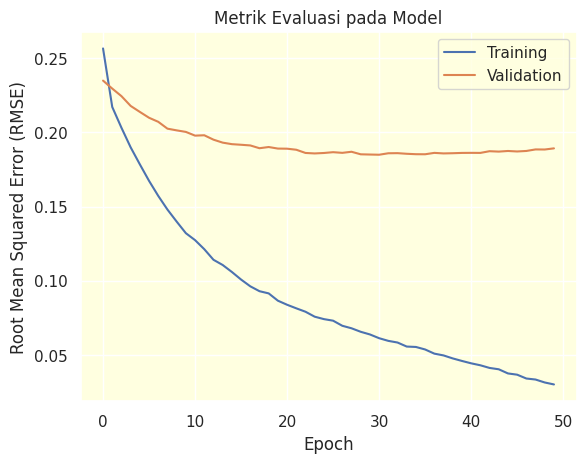

In [53]:
# Membuat line plot untuk menunjukkan metrik evaluasi
plt.plot(history.history["root_mean_squared_error"])
plt.plot(history.history["val_root_mean_squared_error"])

# Menambahkan judul, label, dan legend pada plot
plt.title("Metrik Evaluasi pada Model")
plt.ylabel("Root Mean Squared Error (RMSE)")
plt.xlabel("Epoch")
plt.legend(["Training", "Validation"], loc = "upper right")

# Menampilkan plot
plt.show()

Dengan RMSE untuk training sebesar `0.0303` dan RMSE untuk validation sebesar `0.1892`, model sudah bagus untuk digunakan sebagai sistem rekomendasi. Selanjutnya akan dibuat fungsi untuk menentukan rekomendasi musik berdasarkan colaborative-based filtering.

## D. Pengujian Sistem Rekomendasi

In [54]:
def recommend_tracks_based_on_track_name(track_name, top_n = 10):
    # Memeriksa apakah nama track ada di dalam mapping nama
    if track_name not in name_to_name_encoded:
        print(f"Track dengan judul '{track_name}' tidak ditemukan.")
        return

    # Encoding nama track sesuai dengan nilai encodingnya
    track_name_encoded = name_to_name_encoded[track_name]

    # Membuat list seluruh ID track yang ada
    all_track_ids = list(track_to_track_encoded.values())

    # Mempersiapkan ID dan nama track untuk prediksi
    track_name_array = np.array([[track_name_encoded]] * len(all_track_ids))
    track_id_array = np.array(all_track_ids).reshape(-1, 1)

    # Membentuk array ID dan nama track untuk prediksi
    track_name_track_id_array = np.hstack((track_id_array, track_name_array))

    # Memprediksi popularitas berdasarkan nama track yang dipilih
    popularity = model.predict(track_name_track_id_array).flatten()

    # Mendapatkan Top-N rekomendasi
    top_popularity_indices = popularity.argsort()[-top_n:][::-1]
    recommended_encoded_track_ids = [all_track_ids[x] for x in top_popularity_indices]

    # Mapping ID track yang sudah di encoding ke dataset awal
    recommended_track_ids = [track_encoded_to_track.get(track_id) for track_id in recommended_encoded_track_ids]

    # Menampilkan Top-N rekomendasi berdasarkan nama track
    print(f"Rekomendasi berdasarkan track dengan judul: '{track_name}'")
    print("10 Rekomendasi Terbaik:")
    for track_id in recommended_track_ids:
        if track_id is not None:
            # Output the actual track name
            track_info = data[data["track_id"] == track_id]
            if not track_info.empty:
                print(f"ID Track: {track_id}, Judul Track: {track_info['track_name'].values[0]}")
            else:
                print(f"ID Track '{track_id}' tidak ada di dalam dataset.")

In [55]:
# Menampilkan baris sesuai judul lagu yang ditulis
data[data.track_name.eq('Fire - Killer Hertz Remix')]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,track,name
27234,3j2syVJvnXkHI6oRewQkia,Matrix & Futurebound;Max Marshall;Killer Hertz,Fire (Killer Hertz Remix),Fire - Killer Hertz Remix,20.0,269333,False,0.486,0.951,5,...,0.0563,0.000241,0.262,0.105,0.0473,174.109,4,drum-and-bass,25765,21811


Setelah fungsi siap digunakan, fungsi dipanggil untuk memberikan rekomendasi musik berdasarkan lagu yang telah dipilih/didengar.

In [56]:
# Memanggil fungsi untuk mendapatkan top 10 rekomendasi
recommend_tracks_based_on_track_name("Fire - Killer Hertz Remix", top_n=10)

2805/2805 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
Rekomendasi berdasarkan track dengan judul: 'Fire - Killer Hertz Remix'
10 Rekomendasi Terbaik:
ID Track: 18asYwWugKjjsihZ0YvRxO, Judul Track: The Motto
ID Track: 2dpaYNEQHiRxtZbfNsse99, Judul Track: Happier
ID Track: 4zN21mbAuaD0WqtmaTZZeP, Judul Track: Ferrari
ID Track: 4h9wh7iOZ0GGn8QVp4RAOB, Judul Track: I Ain't Worried
ID Track: 0lYBSQXN6rCTvUZvg9S0lU, Judul Track: Let Me Love You
ID Track: 48AJSd42lXpicsGqcgopof, Judul Track: X ÚLTIMA VEZ
ID Track: 6f3Slt0GbA2bPZlz0aIFXN, Judul Track: The Business
ID Track: 3kUq4sBcmxhnOtNysZ9yrp, Judul Track: Feliz Cumpleaños Ferxxo
ID Track: 7e89621JPkKaeDSTQ3avtg, Judul Track: Sweet Home Alabama
ID Track: 6GG73Jik4jUlQCkKg9JuGO, Judul Track: The Middle
